# Working With OpenCV

## OpenCV Intro:

OpenCV (Open Source Computer Vision Library) is an open-source computer vision and machine learning software library. It provides a wide range of tools and algorithms for various computer vision tasks, including image and video processing, object detection and recognition, facial recognition, machine learning, and more. OpenCV is written in C++ and has interfaces for Python, Java, and other languages.

Key features and capabilities of OpenCV include:

1. **Image and Video Processing:** OpenCV can read, write, and process images and videos. It offers a comprehensive set of image processing functions, including filtering, transformations, and color space conversions.

2. **Feature Detection and Matching:** OpenCV includes algorithms for detecting key features in images and matching them across multiple images, which is essential for tasks like image stitching and object recognition.

3. **Object Detection and Tracking:** OpenCV provides pre-trained models and tools for object detection, tracking, and localization in images and videos. It's commonly used for face detection, object tracking, and more.

4. **Machine Learning:** OpenCV integrates with machine learning libraries like scikit-learn and TensorFlow, making it suitable for creating and deploying machine learning models in computer vision applications.

5. **3D Computer Vision:** OpenCV supports 3D vision tasks like stereo vision, structure from motion (SfM), and camera calibration, which are essential for applications like 3D reconstruction and depth estimation.

6. **Human-Computer Interaction:** OpenCV enables gesture recognition, hand tracking, and facial expression analysis, making it suitable for human-computer interaction applications.

7. **Robotics and Autonomous Vehicles:** OpenCV is used in robotics for tasks such as obstacle detection, navigation, and control. It plays a vital role in autonomous vehicle development.

8. **Medical Imaging:** OpenCV is used in medical image analysis for tasks like tumor detection, organ segmentation, and disease diagnosis.

9. **Augmented Reality (AR) and Virtual Reality (VR):** OpenCV is used in AR and VR applications for object tracking, marker detection, and scene analysis.

10. **Cross-Platform Support:** OpenCV is available on various platforms, including Windows, macOS, Linux, and mobile platforms like Android and iOS.

OpenCV is widely used in computer vision research, as well as in various industries, including robotics, healthcare, automotive, entertainment, and more. Its versatility and extensive community support make it a popular choice for developing computer vision applications and projects.

### Opening an Images

In [3]:
import cv2
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

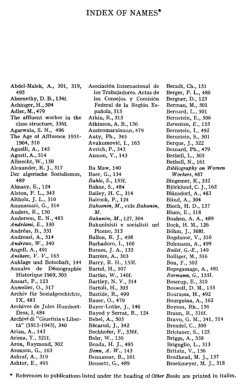

In [6]:
image=cv2.imread('Data/index_3.jpg')
#image=cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(image)

### Display With Actual Size

In [7]:
#displaying-different-images-with-actual-size-in-matplotlib-subplot
def display(im_path):
    dpi = 80
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

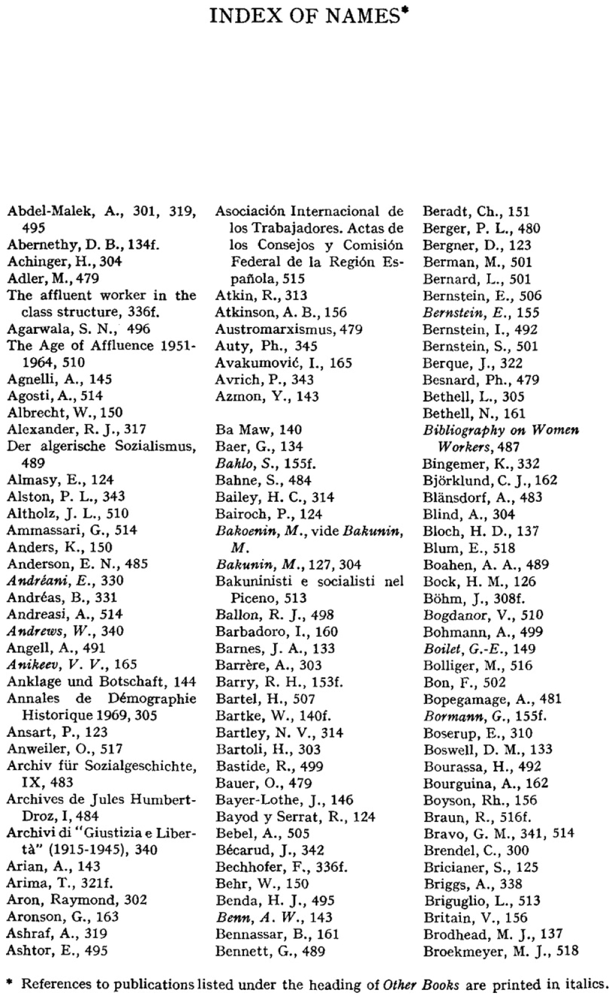

In [8]:
display('Data/index_3.jpg')

## Inverted Images

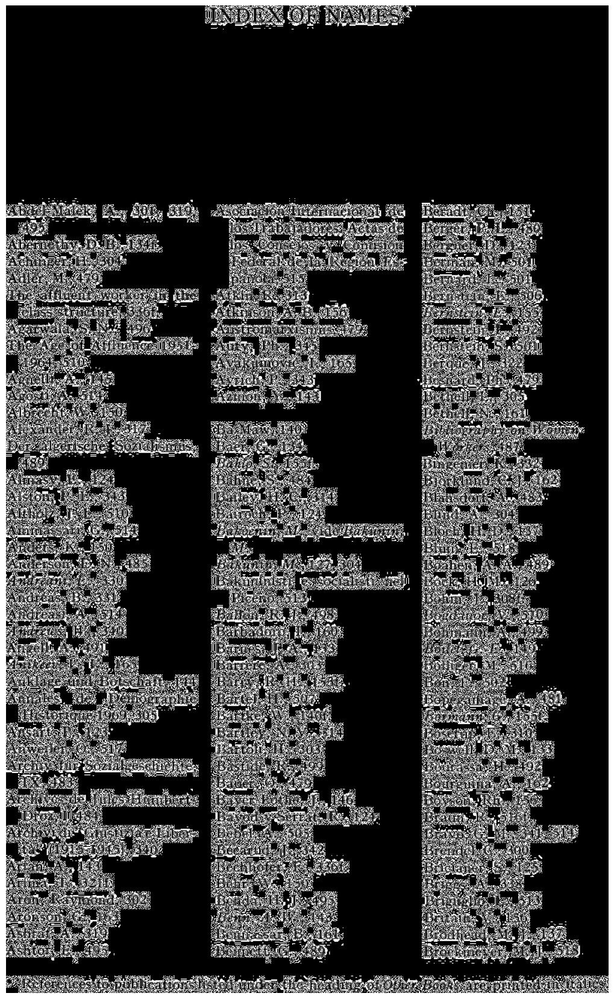

In [15]:
inverted_image=image-255;
#plt.axis('off')
cv2.imwrite('Data/inverted_image.jpg',inverted_image)
#plt.imshow(inverted_image)
display('Data/inverted_image.jpg')

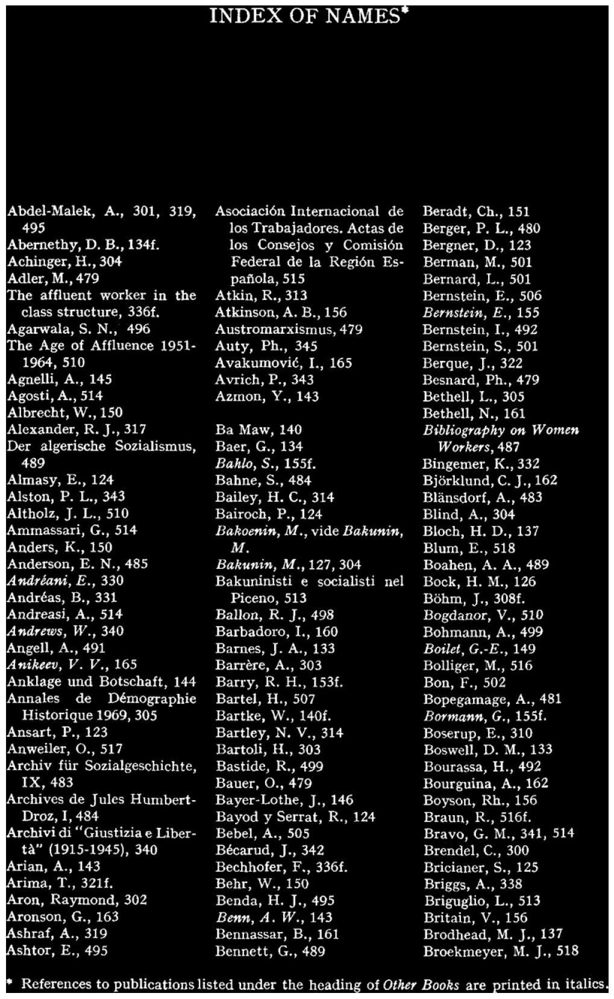

In [14]:
inverted_image2=cv2.bitwise_not(image)
#plt.axis('off')
cv2.imwrite('Data/inverted_image2.jpg',inverted_image2)
#plt.imshow(inverted_image2)
display('Data/inverted_image2.jpg')

## Binarization

In [21]:
def gray_image(image):
    gray_image=cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    return gray_image

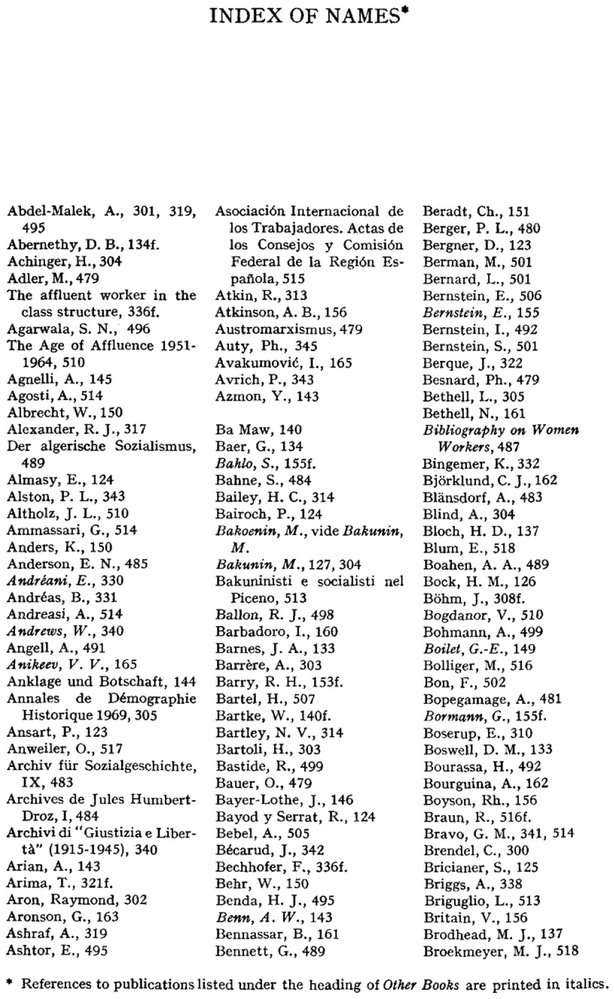

In [22]:
gray_image=gray_image(image)
cv2.imwrite('Data/gray_image.jpg',gray_image)
display('Data/gray_image.jpg')

## Noise Removal

In [23]:
import numpy as np
def noise_removal(image):
    kernel=np.ones((1,1),np.uint8) #kernel
    image=cv2.dilate(image,kernel,iterations=1) # dilation of image with kernel of 1x1
    kernel=np.ones((1,1),np.uint8) #kernel
    image=cv2.erode(image,kernel,iterations=1) # erosion of image with kernel of 1x1
    image=cv2.morphologyEx(image,cv2.MORPH_CLOSE,kernel) # closing of image with kernel of 1x1
    image=cv2.medianBlur(image,3) # median blur of image with kernel of 3x3
    return image


In [24]:
no_noise=noise_removal(gray_image)
cv2.imwrite('Data/no_noise.jpg',no_noise)

True

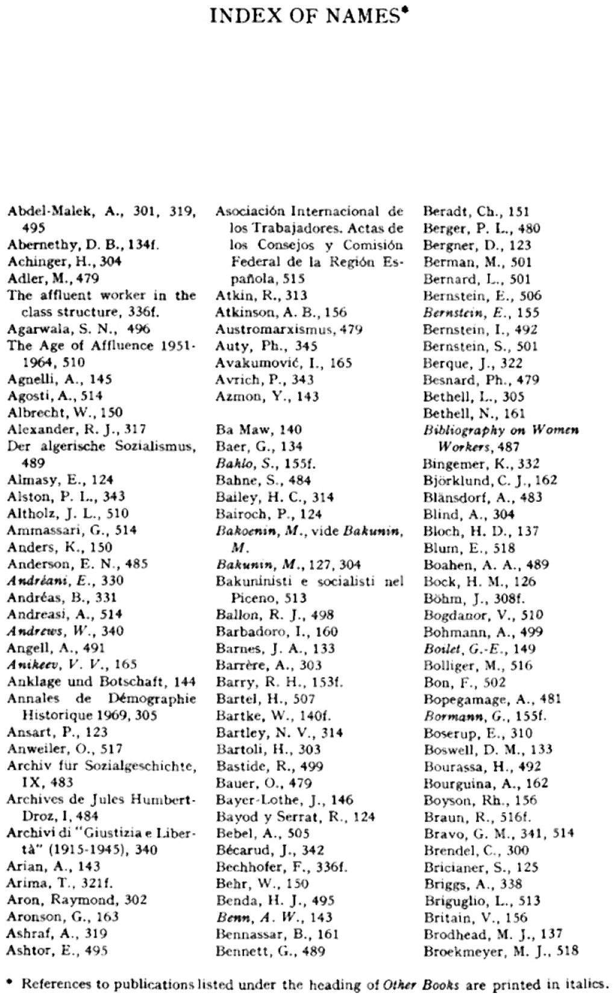

In [25]:
display('Data/no_noise.jpg')

## Rotation 

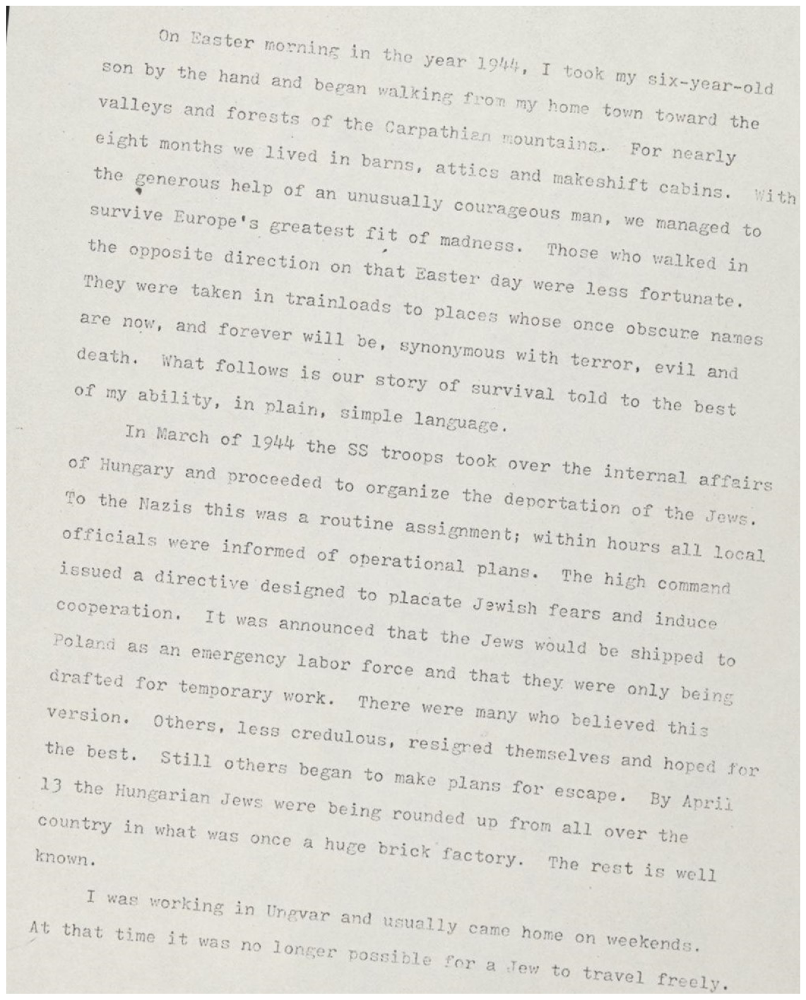

In [27]:
new = cv2.imread("Data/page_01_rotated.JPG")
display("Data/page_01_rotated.JPG")

In [28]:
#https://becominghuman.ai/how-to-automatically-deskew-straighten-a-text-image-using-opencv-a0c30aed83df
import numpy as np

def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("Data/boxes.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle
# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage

In [29]:
# Deskew image
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)

In [30]:
fixed = deskew(new)
cv2.imwrite("Data/rotated_fixed.jpg", fixed)

28


True

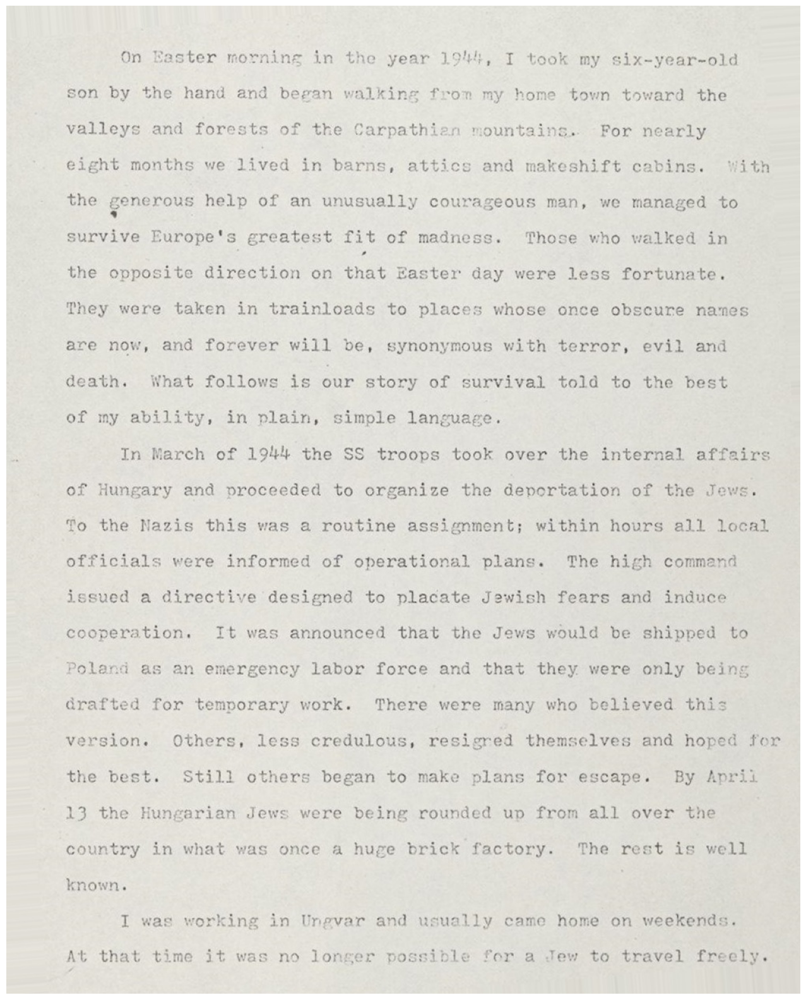

In [31]:
display("Data/rotated_fixed.jpg")

## Removing Borders

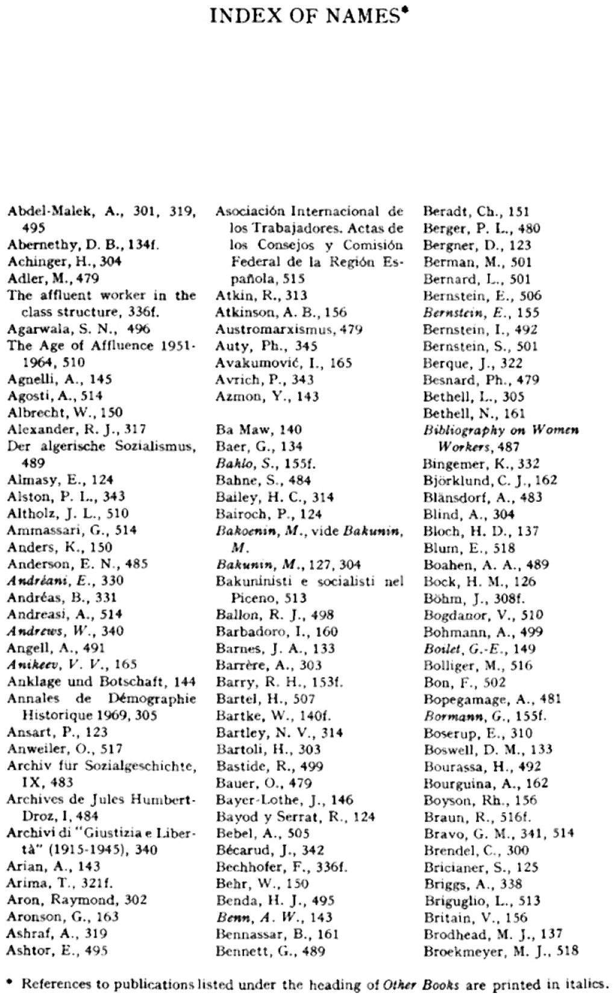

In [32]:
display("Data/no_noise.jpg")

In [33]:
def remove_borders(image):
    contours, heiarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cntsSorted = sorted(contours, key=lambda x:cv2.contourArea(x))
    cnt = cntsSorted[-1]
    x, y, w, h = cv2.boundingRect(cnt)
    crop = image[y:y+h, x:x+w]
    return (crop)

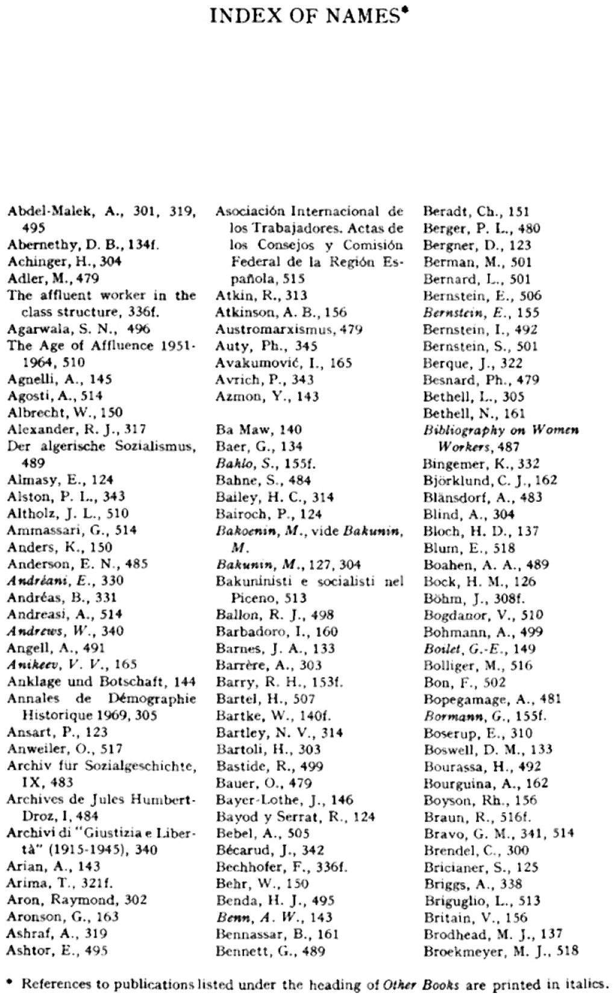

In [34]:
no_borders = remove_borders(no_noise)
cv2.imwrite("Data/no_borders.jpg", no_borders)
display('Data/no_borders.jpg')

## Missing Borders

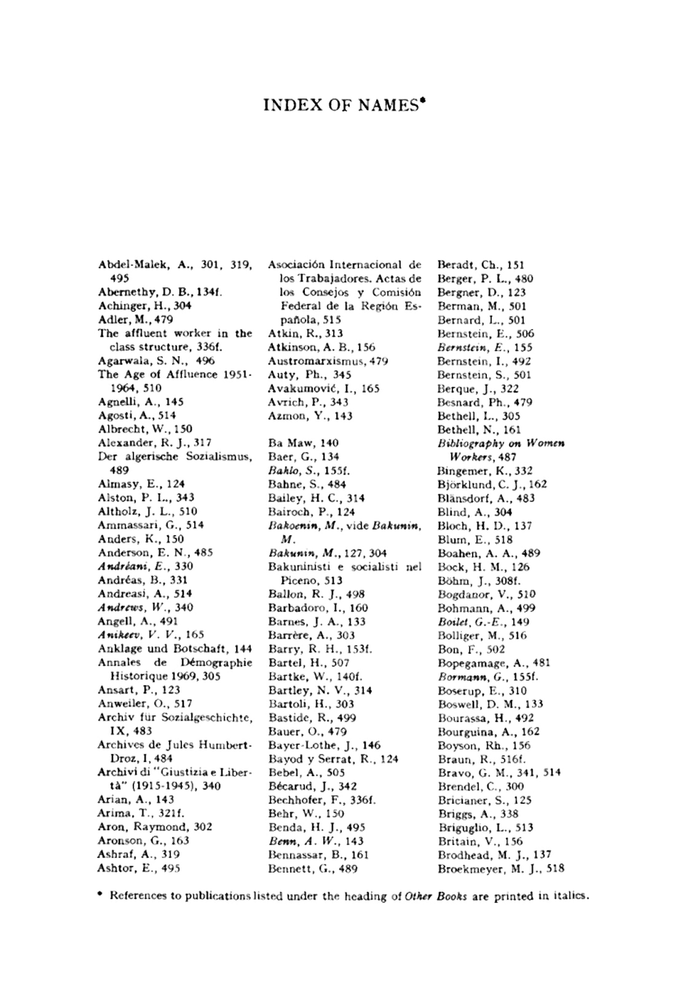

In [35]:
color = [255, 255, 255]
top, bottom, left, right = [150]*4

image_with_border = cv2.copyMakeBorder(no_borders, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
cv2.imwrite("Data/image_with_border.jpg", image_with_border)
display("Data/image_with_border.jpg")